<a href="https://colab.research.google.com/github/manan-garg/Multiclass_Vegetable_Classifier/blob/main/Multiclass_Vegetable_Classifier.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Problem Statement:
To create a multiclass classifier that can recognize the vegetable class which is present in the dataset that includes all the necessary images to accomplish this objective.

# 1. Import Libraries

In [ ]:
import pandas as pd
import numpy as np
import os
import random
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import seaborn as sns
import tensorflow as tf
import glob
import warnings
from sklearn.metrics import confusion_matrix


#2. Set Options

In [ ]:
warnings.simplefilter('ignore')
pd.set_option("display.max_columns", None)
pd.options.display.float_format = '{:.2f}'.format
sns.set_style('white')

#3. Read Data

In [ ]:
!unzip /content/ninjacart_data.zip

Archive:  /content/ninjacart_data.zip
   creating: ninjacart_data/test/
   creating: ninjacart_data/test/indian market/
  inflating: ninjacart_data/test/indian market/bhl.jpeg  
  inflating: ninjacart_data/test/indian market/bhv.jpeg  
  inflating: ninjacart_data/test/indian market/bn.jpeg  
  inflating: ninjacart_data/test/indian market/hjx.jpeg  
  inflating: ninjacart_data/test/indian market/igis.jpeg  
  inflating: ninjacart_data/test/indian market/in.jpeg  
  inflating: ninjacart_data/test/indian market/india-4898453__340.jpg  
  inflating: ninjacart_data/test/indian market/indianmarket10.jpeg  
  inflating: ninjacart_data/test/indian market/indianmarket12.jpeg  
  inflating: ninjacart_data/test/indian market/indianmarket13.jpeg  
  inflating: ninjacart_data/test/indian market/indianmarket14.jpeg  
  inflating: ninjacart_data/test/indian market/indianmarket15.jpeg  
  inflating: ninjacart_data/test/indian market/indianmarket18.jpeg  
  inflating: ninjacart_data/test/indian market/

#4. Exploratory Data Analysis

##4.1 Basic Analysis

The basic structure of the dataset looks like the below screenshot, where we can observe two sub-folders inside the ninjacart_data folder. The two sub-folders are for training and testing data, inside which there are further 4 folders for each class.

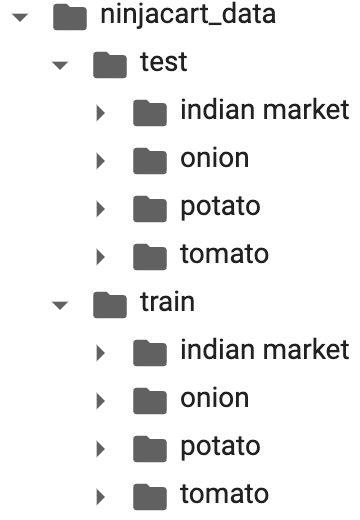

###4.1.1 Visualization of Images - Train data

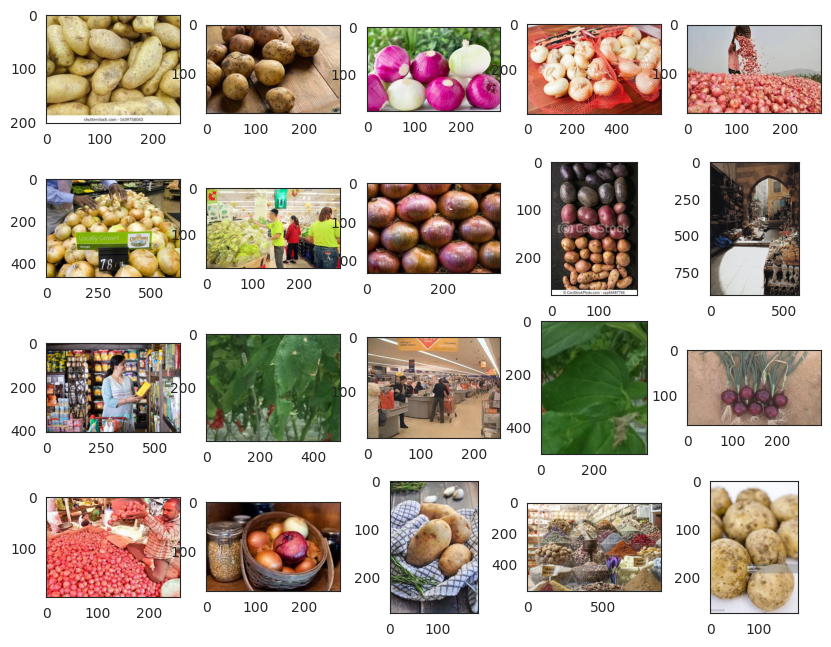

In [ ]:
# visualizing random sample images from every class
train_dict = {}
train_count_dict = {}
training_images = []
for class_folder in os.listdir('/content/ninjacart_data/train'):
  class_folder_path = glob.glob('/content/ninjacart_data/train/{}/*'.format(class_folder))
  train_count_dict[class_folder] = len(class_folder_path)
  random_image_path = random.choice(class_folder_path)
  train_dict[class_folder] = tf.keras.utils.load_img(random_image_path)
  training_images.append(class_folder_path)
all_training_images = [item for sublist in training_images for item in sublist]
v =0
fig = plt.figure(1, figsize=(10, 10))
for i in range(20):
  v += 1
  image = random.choice(all_training_images)
  images = tf.keras.utils.load_img(image)
  plt.subplot(5, 5, v)
  plt.imshow(images)
plt.show()

##4.2 Dimension Analysis - Train data

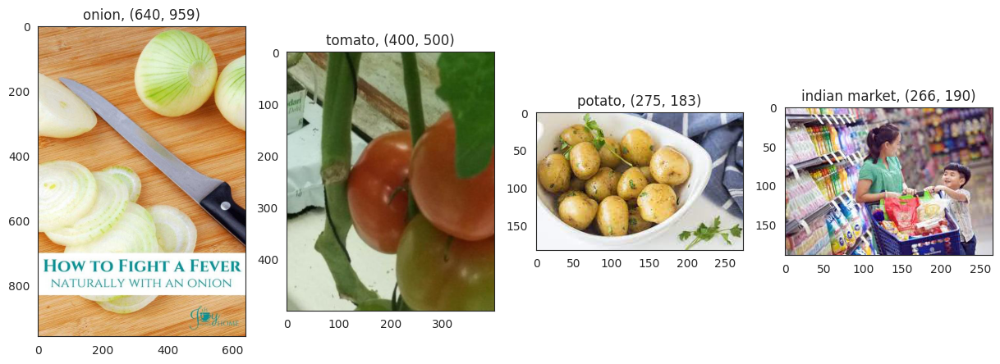

In [ ]:
# checking image dimesions from random samples
plt.figure(figsize=(15, 7))
for i, (cls,img) in enumerate(train_dict.items()):
    ax = plt.subplot(1, 4, i + 1)
    plt.title(f'{cls}, {img.size}')
    plt.imshow(img)

##4.3 Distribution Analysis - Train data

Class along with their image counts: {'onion': 849, 'tomato': 789, 'potato': 898, 'indian market': 599}


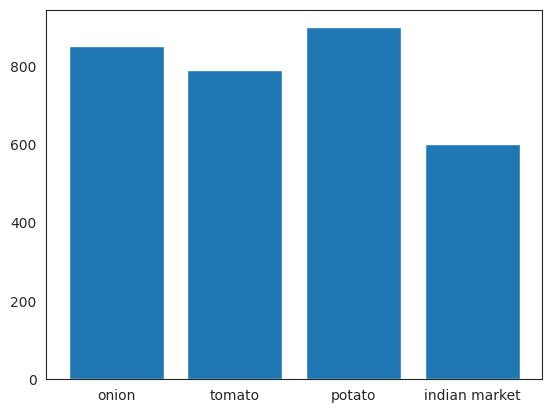

In [ ]:
# checking number of images per class
print("Class along with their image counts:", train_count_dict)

training_class = list(train_count_dict.keys())
class_count = list(train_count_dict.values())
plt.bar(range(len(train_count_dict)), class_count, tick_label=training_class)
plt.show()

## 4.4 Distribution Analysis - Test data

In [ ]:
# getting random image per class into a dictionary
test_dict = {}
test_count_dict = {}

for class_folder in os.listdir("/content/ninjacart_data/test"):
    class_folder_path = glob.glob('/content/ninjacart_data/test/{}/*'.format(class_folder))
    test_count_dict[class_folder] = len(class_folder_path)
    random_image_path = random.choice(class_folder_path)
    test_dict[class_folder] = tf.keras.utils.load_img(random_image_path)

Class along with their image counts: {'onion': 83, 'tomato': 106, 'potato': 81, 'indian market': 81}


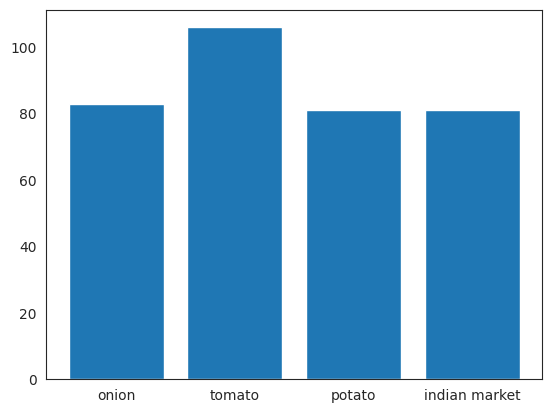

In [ ]:
# checking number of images per class
print("Class along with their image counts:", test_count_dict)

test_class = list(test_count_dict.keys())
class_count = list(test_count_dict.values())
plt.bar(range(len(test_count_dict)), class_count, tick_label=training_class)
plt.show()

#5. Preparing dataset for modelling

In [ ]:
# training data
train_df = tf.keras.utils.image_dataset_from_directory('/content/ninjacart_data/train', label_mode = 'categorical', image_size = (256, 256),
                                                       validation_split = 0.2, subset = "training", seed = 1996)

Found 3135 files belonging to 4 classes.
Using 2508 files for training.


In [ ]:
# vallidation data
validation_df = tf.keras.utils.image_dataset_from_directory('/content/ninjacart_data/train', label_mode = 'categorical', image_size = (256, 256),
                                                       validation_split = 0.2, subset = "validation", seed = 1996)

Found 3135 files belonging to 4 classes.
Using 627 files for validation.


In [ ]:
# test data
test_df = tf.keras.utils.image_dataset_from_directory('/content/ninjacart_data/test', label_mode = 'categorical', image_size = (256, 256), seed = 1996)

Found 351 files belonging to 4 classes.


In [ ]:
# list of all classes in alphabetic order as label_mode = 'categorical' one-hot encodes the classes alphabetically
all_classes = ['indian market', 'onion', 'potato', 'tomato']

#6. Performance Analysis Functions

In [ ]:
# accuracy plot
def model_accuracy_analysis(history):
  plt.plot(history.history['accuracy'])
  plt.plot(history.history['val_accuracy'])
  plt.title('model accuracy')
  plt.ylabel('accuracy')
  plt.xlabel('epoch')
  plt.legend(['train', 'val'], loc='upper left')
  plt.show()

# loss plot
def model_loss_analysis(history):
  plt.plot(history.history['loss'])
  plt.plot(history.history['val_loss'])
  plt.title('model loss')
  plt.ylabel('loss')
  plt.xlabel('epoch')
  plt.legend(['train', 'val'], loc='upper left')
  plt.show()

#7. Model Testing Functions

In [ ]:
# testing model on random image per class
def test_model(model):
  test_images = []
  for i in all_classes:
    test_images.append(test_dict[i])
  fig = plt.figure(1, figsize=(15, 10))
  plt.axis('off')
  v = 0
  for i in range(4):
    v += 1
    image = tf.keras.utils.img_to_array(test_images[i])
    image = tf.image.resize(image, (256, 256))
    image_1 = tf.expand_dims(image, axis = 0)

    pred = model.predict(image_1)
    predicted_class = tf.argmax(pred, 1).numpy().item()

    plt.subplot(1, 4, v)
    plt.axis('off')
    plt.title('prediction : {}'.format(all_classes[predicted_class]))
    plt.imshow(image/255)
  plt.show()

In [ ]:
# getting confusion matrix for the model
def get_confusion_matrix(model):
  # Get the class names from the dataset
  class_names = test_df.class_names

  # Create a list of true labels and predicted labels
  true_labels = []
  predicted_labels = []

  # Loop over the test data and labels
  for images, labels in test_df:
      # Make predictions on the test data using your trained CNN model
      predictions = model.predict(images)

      # Get the class predictions from the predicted probabilities
      class_predictions = np.argmax(predictions, axis=1)

      # Append the true and predicted labels to the lists
      true_labels.extend(np.argmax(labels.numpy(), axis=1))
      predicted_labels.extend(class_predictions.tolist())

  # Create the confusion matrix
  confusion_mtx = confusion_matrix(true_labels, predicted_labels)

  # Plot the confusion matrix as a heatmap
  sns.heatmap(confusion_mtx, xticklabels=class_names, yticklabels=class_names,
            annot=True, fmt='g', cmap='Blues')
  plt.xlabel('Predicted')
  plt.ylabel('True')
  plt.show()

#8. Baseline CNN Model

##8.1 Architecture

In [ ]:
model = tf.keras.Sequential([
tf.keras.layers.Rescaling(1./255),
tf.keras.layers.InputLayer(input_shape = [256, 256, 3]),
tf.keras.layers.Conv2D(filters = 32, kernel_size = (3,3), padding = 'Same', activation = 'relu'),
tf.keras.layers.Conv2D(filters = 32, kernel_size = (3,3), padding = 'Same', activation = 'relu'),
tf.keras.layers.MaxPool2D(pool_size = (2,2)),
tf.keras.layers.Conv2D(filters = 64, kernel_size = (3,3), padding = 'Same', activation = 'relu'),
tf.keras.layers.Conv2D(filters = 64, kernel_size = (3,3), padding = 'Same', activation = 'relu'),
tf.keras.layers.MaxPool2D(pool_size = (2,2)),
tf.keras.layers.Conv2D(filters = 128, kernel_size = (3,3), padding = 'Same', activation = 'relu'),
tf.keras.layers.GlobalAveragePooling2D(),
tf.keras.layers.Dense(4, activation = 'softmax')
])
model.compile(optimizer = tf.keras.optimizers.Adam(learning_rate = 1e-4), loss = tf.keras.losses.CategoricalCrossentropy(), metrics = ['accuracy'])

##8.2 Training

In [ ]:
# Implementing TensorBoard callback
TensorBoard_callback = tf.keras.callbacks.TensorBoard(log_dir="logs/baseline_CNN_model", histogram_freq=1)

In [ ]:
# fitting the model
history = model.fit(train_df, epochs=20, validation_data=validation_df, callbacks=[TensorBoard_callback])

Epoch 1/20
79/79 [==============================] - 32s 211ms/step - loss: 1.3319 - accuracy: 0.2974 - val_loss: 1.2414 - val_accuracy: 0.4928
Epoch 2/20
79/79 [==============================] - 14s 168ms/step - loss: 1.0335 - accuracy: 0.6184 - val_loss: 0.8285 - val_accuracy: 0.6906
Epoch 3/20
79/79 [==============================] - 16s 190ms/step - loss: 0.7653 - accuracy: 0.7069 - val_loss: 0.7188 - val_accuracy: 0.7321
Epoch 4/20
79/79 [==============================] - 14s 171ms/step - loss: 0.6867 - accuracy: 0.7344 - val_loss: 0.6902 - val_accuracy: 0.7528
Epoch 5/20
79/79 [==============================] - 14s 171ms/step - loss: 0.6452 - accuracy: 0.7576 - val_loss: 0.6565 - val_accuracy: 0.7624
Epoch 6/20
79/79 [==============================] - 15s 178ms/step - loss: 0.6239 - accuracy: 0.7608 - val_loss: 0.6260 - val_accuracy: 0.7687
Epoch 7/20
79/79 [==============================] - 15s 170ms/step - loss: 0.6051 - accuracy: 0.7699 - val_loss: 0.6081 - val_accuracy: 0.7687

In [ ]:
# summary
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 rescaling (Rescaling)       (None, 256, 256, 3)       0         
                                                                 
 input_1 (InputLayer)        multiple                  0         
                                                                 
 conv2d (Conv2D)             (None, 256, 256, 32)      896       
                                                                 
 conv2d_1 (Conv2D)           (None, 256, 256, 32)      9248      
                                                                 
 max_pooling2d (MaxPooling2D  (None, 128, 128, 32)     0         
 )                                                               
                                                                 
 conv2d_2 (Conv2D)           (None, 128, 128, 64)      18496     
                                                        

##8.3 Model Performance

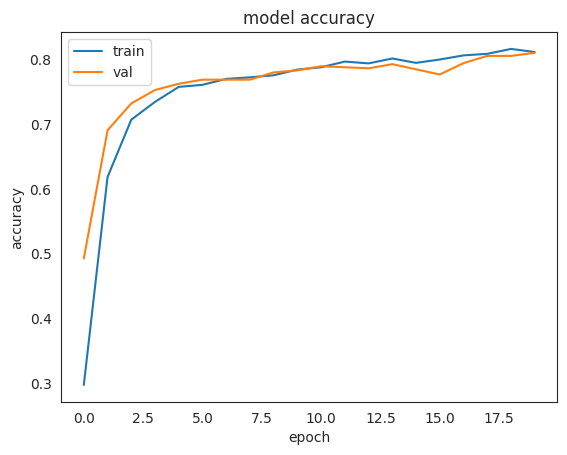

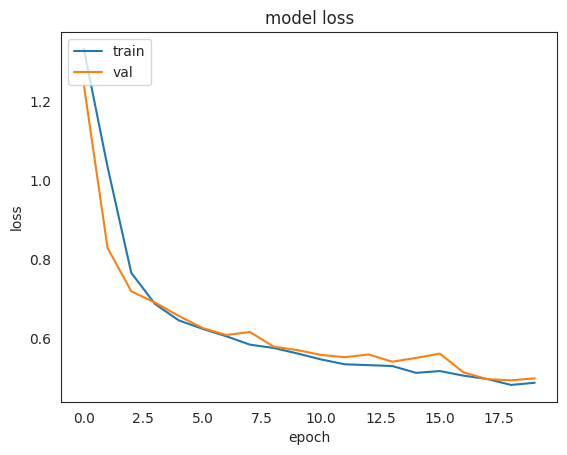

In [ ]:
model_accuracy_analysis(history)
model_loss_analysis(history)

##8.4 Model Testing

1/1 [==============================] - 0s 19ms/step


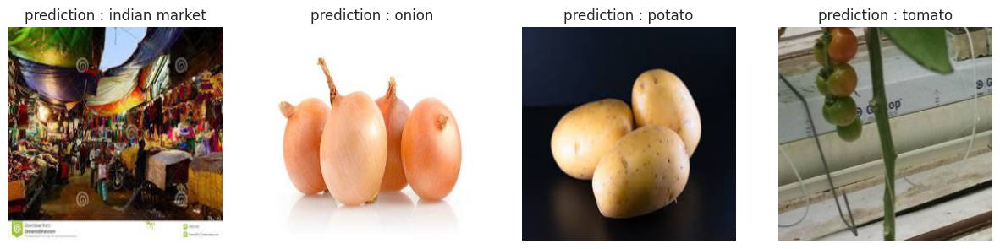

In [ ]:
# prediction on random image per class
test_model(model)

1/1 [==============================] - 0s 32ms/step


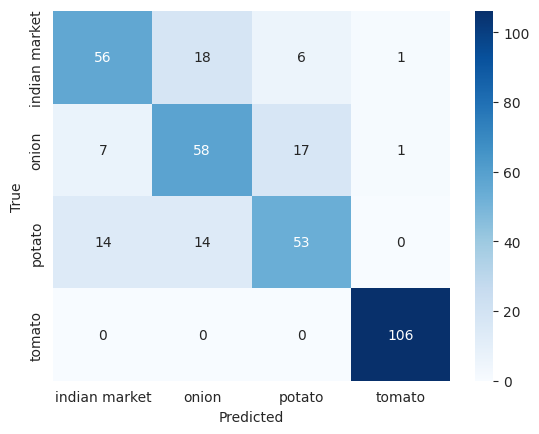

In [ ]:
# confusion matrix for the model
get_confusion_matrix(model)

In [ ]:
# test accuracy for the model
model.evaluate(test_df)

11/11 [==============================] - 1s 61ms/step - loss: 0.4945 - accuracy: 0.7778


[0.49451515078544617, 0.7777777910232544]

#9. Tuned CNN Model

##9.1 Architecture

In [ ]:
# augmenting images to reduce overfitting
augmentation = tf.keras.Sequential([
    tf.keras.layers.RandomFlip("horizontal_and_vertical"),
    tf.keras.layers.RandomRotation(0.2),
    tf.keras.layers.RandomTranslation(height_factor = 0.2, width_factor=0.2)
])

aug_df = train_df

for img, img_class in aug_df :
  img = augmentation(img)

In [ ]:
# adding batch normalization and droupout to reduce overfitting
tuned_model = tf.keras.Sequential([
tf.keras.layers.Rescaling(1./255),
tf.keras.layers.InputLayer(input_shape = [256, 256, 3]),
tf.keras.layers.Conv2D(filters = 32, kernel_size = (3,3), padding = 'Same', activation = 'relu'),
tf.keras.layers.Conv2D(filters = 32, kernel_size = (3,3), padding = 'Same', activation = 'relu'),
tf.keras.layers.BatchNormalization(),
tf.keras.layers.MaxPool2D(pool_size = (2,2)),
tf.keras.layers.Conv2D(filters = 64, kernel_size = (3,3), padding = 'Same', activation = 'relu'),
tf.keras.layers.Conv2D(filters = 64, kernel_size = (3,3), padding = 'Same', activation = 'relu'),
tf.keras.layers.BatchNormalization(),
tf.keras.layers.MaxPool2D(pool_size = (2,2)),
tf.keras.layers.Conv2D(filters = 128, kernel_size = (3,3), padding = 'Same', activation = 'relu'),
tf.keras.layers.BatchNormalization(),
tf.keras.layers.GlobalAveragePooling2D(),
tf.keras.layers.Dropout(rate = 0.2),
tf.keras.layers.Dense(4, activation = 'softmax')
])
tuned_model.compile(optimizer = tf.keras.optimizers.Adam(learning_rate = 1e-4), loss = tf.keras.losses.CategoricalCrossentropy(), metrics = ['accuracy'])

##9.2 Training

In [ ]:
# Implementing callbacks
TensorBoard_callback = tf.keras.callbacks.TensorBoard(log_dir = "logs/Tuned_CNN_model", histogram_freq = 1)
ModelCheckpoint_callback = tf.keras.callbacks.ModelCheckpoint("best_CNN_model.h5", save_best_only = True)
EarlyStopping_callback = tf.keras.callbacks.EarlyStopping(monitor = 'val_loss', patience = 5, restore_best_weights = True)

In [ ]:
# fitting the model
tuned_history = tuned_model.fit(aug_df, epochs=20, validation_data=validation_df, callbacks=[TensorBoard_callback,ModelCheckpoint_callback,EarlyStopping_callback])

Epoch 1/20
79/79 [==============================] - 19s 185ms/step - loss: 0.6988 - accuracy: 0.7344 - val_loss: 1.5630 - val_accuracy: 0.2584
Epoch 2/20
79/79 [==============================] - 16s 194ms/step - loss: 0.5576 - accuracy: 0.7911 - val_loss: 1.9809 - val_accuracy: 0.2584
Epoch 3/20
79/79 [==============================] - 16s 189ms/step - loss: 0.4941 - accuracy: 0.8142 - val_loss: 2.5241 - val_accuracy: 0.2584
Epoch 4/20
79/79 [==============================] - 16s 194ms/step - loss: 0.4588 - accuracy: 0.8254 - val_loss: 2.4452 - val_accuracy: 0.2584
Epoch 5/20
79/79 [==============================] - 16s 182ms/step - loss: 0.4280 - accuracy: 0.8445 - val_loss: 2.0330 - val_accuracy: 0.2616
Epoch 6/20
79/79 [==============================] - 15s 185ms/step - loss: 0.3979 - accuracy: 0.8537 - val_loss: 1.1823 - val_accuracy: 0.4051
Epoch 7/20
79/79 [==============================] - 17s 198ms/step - loss: 0.3898 - accuracy: 0.8596 - val_loss: 0.8051 - val_accuracy: 0.6810

In [ ]:
# summary
tuned_model.summary()

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 rescaling_2 (Rescaling)     (None, 256, 256, 3)       0         
                                                                 
 input_2 (InputLayer)        multiple                  0         
                                                                 
 conv2d_5 (Conv2D)           (None, 256, 256, 32)      896       
                                                                 
 conv2d_6 (Conv2D)           (None, 256, 256, 32)      9248      
                                                                 
 batch_normalization (BatchN  (None, 256, 256, 32)     128       
 ormalization)                                                   
                                                                 
 max_pooling2d_2 (MaxPooling  (None, 128, 128, 32)     0         
 2D)                                                  

##9.3 Tuned Model Performance

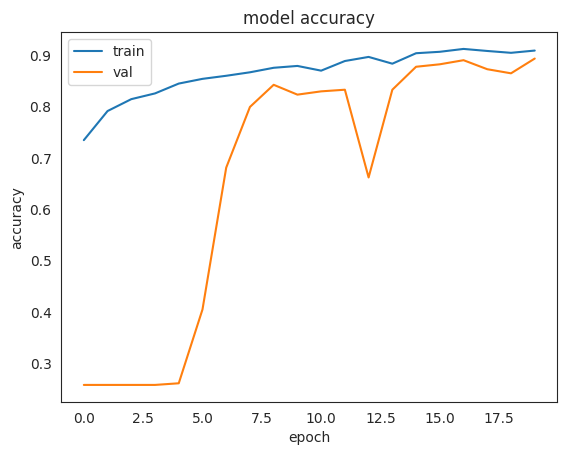

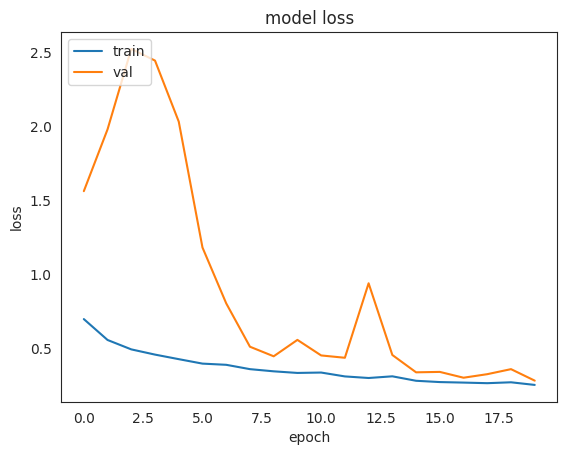

In [ ]:
model_accuracy_analysis(tuned_history)
model_loss_analysis(tuned_history)

##9.4 Tuned Model Testing

1/1 [==============================] - 0s 20ms/step


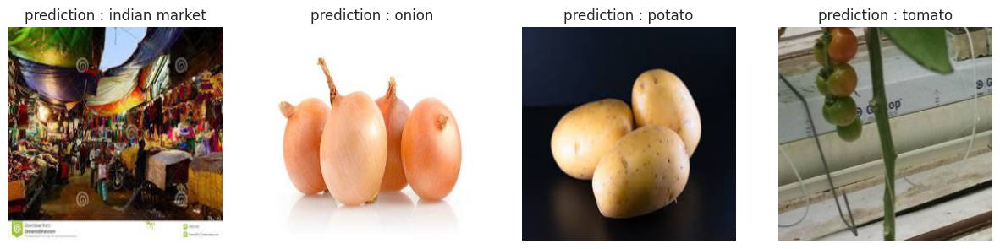

In [ ]:
# prediction on random image per class
test_model(tuned_model)

1/1 [==============================] - 0s 42ms/step


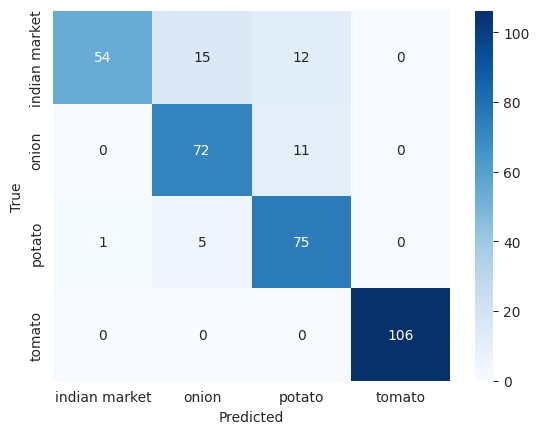

In [ ]:
# confusion matrix for the model
get_confusion_matrix(tuned_model)

In [ ]:
# test accuracy for the model
tuned_model.evaluate(test_df)

11/11 [==============================] - 2s 78ms/step - loss: 0.3482 - accuracy: 0.8746


[0.34821975231170654, 0.874643862247467]

#10. Transfer Learning - Choosing one model out of (VGG, ResNet and MobileNet)

##10.1 ResNet

In [ ]:
# getting resnet model
resnet_model = tf.keras.applications.resnet50.ResNet50(input_shape=(256, 256, 3), include_top = False)

94765736/94765736 [==============================] - 3s 0us/step


##10.2 Architecture

In [ ]:
# get output from resnet model
tr_learn_model = resnet_model.output

# create final architecture on top of resnet output
tr_learn_model = tf.keras.Sequential([
            tf.keras.layers.Rescaling(1./255),
            tf.keras.layers.InputLayer(input_shape=[256,256, 3]),
            resnet_model,
            tf.keras.layers.GlobalAveragePooling2D(),
            tf.keras.layers.Dropout(rate = 0.1),
            tf.keras.layers.Dense(4, activation = 'softmax')
        ])
tr_learn_model.compile(optimizer = tf.keras.optimizers.Adam(learning_rate = 1e-4),loss = tf.keras.losses.CategoricalCrossentropy(),metrics = ['accuracy'])

##10.3 Training

In [ ]:
# Implementing callbacks
TensorBoard_callback = tf.keras.callbacks.TensorBoard(log_dir = "logs/ResNet_model", histogram_freq = 1)
ModelCheckpoint_callback = tf.keras.callbacks.ModelCheckpoint("ResNet_model.h5", save_best_only = True)
EarlyStopping_callback = tf.keras.callbacks.EarlyStopping(monitor = 'val_loss', patience = 5, restore_best_weights = True)

In [ ]:
# fitting the model
tr_learn_history = tr_learn_model.fit(aug_df, validation_data = validation_df, epochs = 20, callbacks=[TensorBoard_callback, ModelCheckpoint_callback, EarlyStopping_callback])

Epoch 1/20
79/79 [==============================] - 87s 573ms/step - loss: 0.1633 - accuracy: 0.9422 - val_loss: 2.1177 - val_accuracy: 0.1914
Epoch 2/20
79/79 [==============================] - 40s 494ms/step - loss: 0.0314 - accuracy: 0.9920 - val_loss: 2.5204 - val_accuracy: 0.1946
Epoch 3/20
79/79 [==============================] - 41s 515ms/step - loss: 0.0089 - accuracy: 0.9984 - val_loss: 2.7953 - val_accuracy: 0.1898
Epoch 4/20
79/79 [==============================] - 41s 507ms/step - loss: 0.0103 - accuracy: 0.9972 - val_loss: 2.0082 - val_accuracy: 0.1579
Epoch 5/20
79/79 [==============================] - 40s 493ms/step - loss: 0.0158 - accuracy: 0.9956 - val_loss: 3.2100 - val_accuracy: 0.2026
Epoch 6/20
79/79 [==============================] - 41s 513ms/step - loss: 0.0242 - accuracy: 0.9916 - val_loss: 3.2323 - val_accuracy: 0.2871
Epoch 7/20
79/79 [==============================] - 40s 502ms/step - loss: 0.0126 - accuracy: 0.9964 - val_loss: 1.3901 - val_accuracy: 0.4896

In [ ]:
# summary
tr_learn_model.summary()

Model: "sequential_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 rescaling_3 (Rescaling)     (None, 256, 256, 3)       0         
                                                                 
 input_4 (InputLayer)        multiple                  0         
                                                                 
 resnet50 (Functional)       (None, 8, 8, 2048)        23587712  
                                                                 
 global_average_pooling2d_2   (None, 2048)             0         
 (GlobalAveragePooling2D)                                        
                                                                 
 dropout_1 (Dropout)         (None, 2048)              0         
                                                                 
 dense_2 (Dense)             (None, 4)                 8196      
                                                      

##10.4 ResNet Model Performance

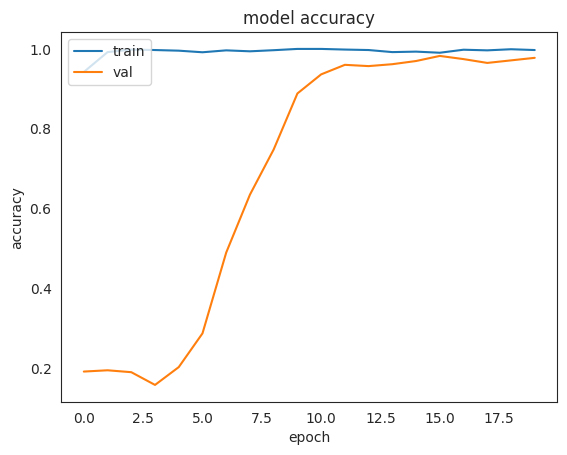

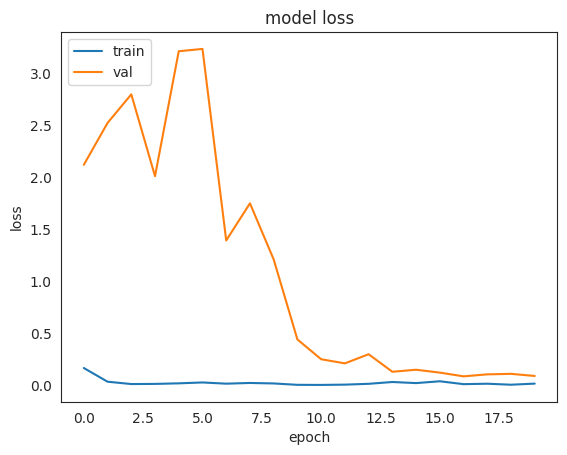

In [ ]:
model_accuracy_analysis(tr_learn_history)
model_loss_analysis(tr_learn_history)

#11. Comparison of Models

In [ ]:
data = {
    'Train Accuracy': ['81%','93%','100%'],
    'Validation Accuracy': ['81%','89%','98%'],
    'Test Accuracy': ['77%','87%','-']
    }
pd.DataFrame(data,index=['Baseline Model','Tuned Model', 'Transfer Learning (ResNet) model'])

,Train Accuracy,Validation Accuracy,Test Accuracy
Baseline Model,81%,81%,77%
Tuned Model,93%,89%,87%
Transfer Learning (ResNet) model,100%,98%,-


#12. Tensorboard

In [ ]:
%load_ext tensorboard
%tensorboard --logdir /content/logs

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


Reusing TensorBoard on port 6006 (pid 23357), started 0:01:07 ago. (Use '!kill 23357' to kill it.)

<IPython.core.display.Javascript object>

#13. Testing the best model (ResNet)

1/1 [==============================] - 0s 22ms/step


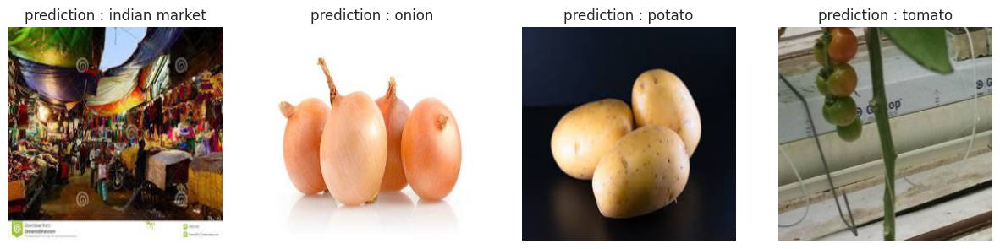

In [ ]:
# prediction on random image per class
test_model(tr_learn_model)

1/1 [==============================] - 0s 58ms/step


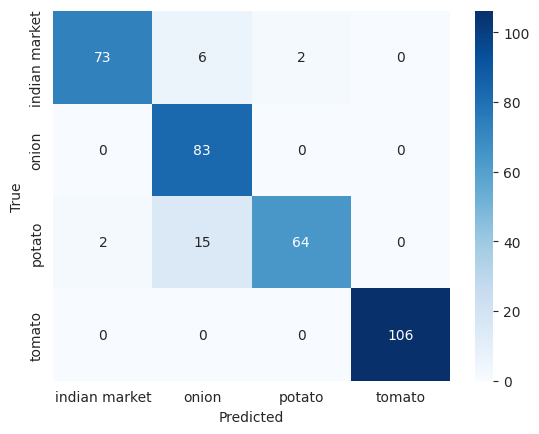

In [ ]:
get_confusion_matrix(tr_learn_model)

In [ ]:
# test accuracy for the model
tr_learn_model.evaluate(test_df)

11/11 [==============================] - 2s 117ms/step - loss: 0.3644 - accuracy: 0.9288


[0.3643542230129242, 0.9287749528884888]

#14. Summary & Insights

1) The distribution of data is not uniform, but it is also not imbalanced.

2) The baseline CNN model is uncertain about the accurate classification.

3) The baseline CNN model has a categorical cross-entropy loss of approximately 0.49, which suggests the presence of overfitting.

4) By incorporating data augmentation, applying dropout and batch normalization, and implementing callbacks during training, a significant increase in test accuracy of about 10% is noticed.

5) Tuned model can effectively distinguish between all classes with minimal margin of error.

6) According to the tuned model, potato and onion are the most difficult classes to distinguish between, as they tend to be confused with one another.

7) As per tuned model, tomato class can be distinguished with the least amount of error.

8) Attained a test accuracy of 92% on the ResNet model that was fine-tuned.

9) Upon completing the training of all the models, it was determined that ResNet was the most accurate model for the dataset.

10) ResNet produced the highest test accuracy, while the baseline CNN provided the lowest accuracy.

11) The ResNet model was found to be highly confident in accurately classifying each image that was plotted, suggesting that it is an excellent choice for the classification task.